In [8]:
%matplotlib inline

import os
os.environ["FIONA_GL2D_DIR"] = os.environ.get(
    "FIONA_GL2D_DIR",
    "/n/netscratch/dvorkin_lab/Lab/nephremidze/2-LISA/0-parallel/fift_gl2d"
)
os.environ["FIONA_GL2D_STRICT"] = os.environ.get("FIONA_GL2D_STRICT", "0")
os.environ["OMP_NUM_THREADS"] = os.environ.get("OMP_NUM_THREADS", "112")

import pathlib, time, numpy as np, matplotlib.pyplot as plt
from fiona import SIS, set_num_threads, FresnelNUFFT3

set_num_threads(112)

In [33]:
def animate_Fw(
    lens=SIS(psi0=1.0),
    w_min=5,
    w_max=10,
    n_frames=50,
    gl_nodes_per_dim=1000,
    max_physical_radius=12.0,
    nufft_tol=1e-13,
    batch_frequencies=True,
    chunk_frequencies=False,
    frequency_binning="log",
    frequency_bin_width=0.5,
    auto_R_from_gl_nodes=False,
    use_tail_correction=True,
    coordinate_system="cartesian",
    polar_radial_nodes=None,
    polar_angular_nodes=None,
    uniform_angular_sampling=True,
    numexpr_nthreads=64,
    verbose=False,
    y_extent=3.0,
    Ny=128,
    Nx=128,
    cmap="viridis",
    font_size=14,
):
    plt.rcParams.update({
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "font.size": font_size,
    })

    w_grid = np.linspace(w_min, w_max, n_frames)

    y1 = np.linspace(-y_extent, y_extent, Nx)
    y2 = np.linspace(-y_extent, y_extent, Ny)
    Y1, Y2 = np.meshgrid(y1, y2, indexing="xy")

    y1_targets = Y1.ravel()
    y2_targets = Y2.ravel()

    nu3 = FresnelNUFFT3(
        lens,
        gl_nodes_per_dim=gl_nodes_per_dim,
        max_physical_radius=max_physical_radius,
        nufft_tol=nufft_tol,
        batch_frequencies=batch_frequencies,
        chunk_frequencies=chunk_frequencies,
        frequency_binning=frequency_binning,
        frequency_bin_width=frequency_bin_width,
        auto_R_from_gl_nodes=auto_R_from_gl_nodes,
        use_tail_correction=use_tail_correction,
        coordinate_system=coordinate_system,
        polar_radial_nodes=polar_radial_nodes,
        polar_angular_nodes=polar_angular_nodes,
        uniform_angular_sampling=uniform_angular_sampling,
        numexpr_nthreads=numexpr_nthreads,
        verbose=verbose,
    )

    F_all = nu3(w_grid, y1_targets, y2_targets, verbose=False)

    F_abs = np.abs(F_all)
    global_min = float(F_abs.min())
    global_max = float(F_abs.max())

    from matplotlib.colors import Normalize
    from matplotlib import animation

    fig, ax = plt.subplots(figsize=(6, 5))

    frame0 = F_abs[0].reshape(Ny, Nx)
    im = ax.imshow(
        frame0,
        origin="lower",
        extent=[y1.min(), y1.max(), y2.min(), y2.max()],
        norm=Normalize(vmin=global_min, vmax=global_max),
        aspect="equal",
        cmap=cmap,
    )

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(r"$|F(\omega, \mathbf{y})|$", fontsize=font_size)
    cbar.ax.tick_params(labelsize=font_size)

    step = 2
    start = step * np.ceil(global_min / step)
    end   = step * np.floor(global_max / step)
    cbar.set_ticks(np.arange(start, end + 0.5*step, step))

    xticks = np.arange(np.ceil(-y_extent), np.floor(y_extent) + 1, 1)
    yticks = np.arange(np.ceil(-y_extent), np.floor(y_extent) + 1, 1)

    ax.set_xticks(xticks)
    ax.set_yticks(yticks)

    ax.set_xlabel(r"$y_1$", fontsize=font_size)
    ax.set_ylabel(r"$y_2$", fontsize=font_size)

    plt.tight_layout()

    def init():
        im.set_data(F_abs[0].reshape(Ny, Nx))
        return [im]

    def update(frame_idx):
        im.set_data(F_abs[frame_idx].reshape(Ny, Nx))
        return [im]

    anim = animation.FuncAnimation(
        fig,
        update,
        init_func=init,
        frames=n_frames,
        interval=150,
        blit=True,
    )

    from IPython.display import HTML
    return HTML(anim.to_jshtml())


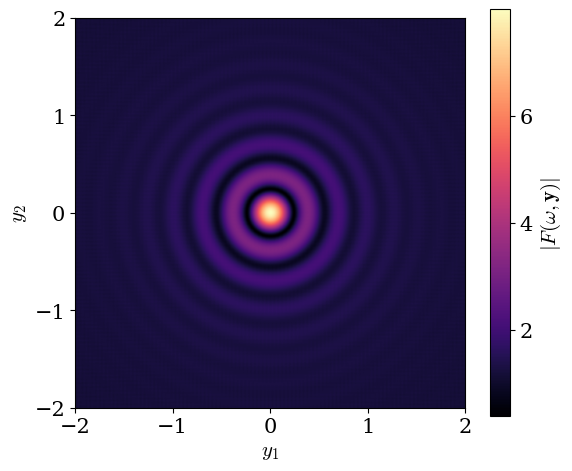

In [34]:
animate_Fw(
    lens=SIS(psi0=1.0),
    w_min=0.1,
    w_max=10.0,
    n_frames=50,
    gl_nodes_per_dim=5000,
    max_physical_radius=500.0,     # replaces your old "Umax" knob
    nufft_tol=1e-13,
    batch_frequencies=True,
    chunk_frequencies=True,       # single shared setup across all frames
    auto_R_from_gl_nodes=True,    # fixed physical window radius like your old usage
    use_tail_correction=True,
    numexpr_nthreads=64,
    verbose=False,
    y_extent=2.0,
    Ny=500,
    Nx=500,
    cmap="magma",
    font_size=15,
)

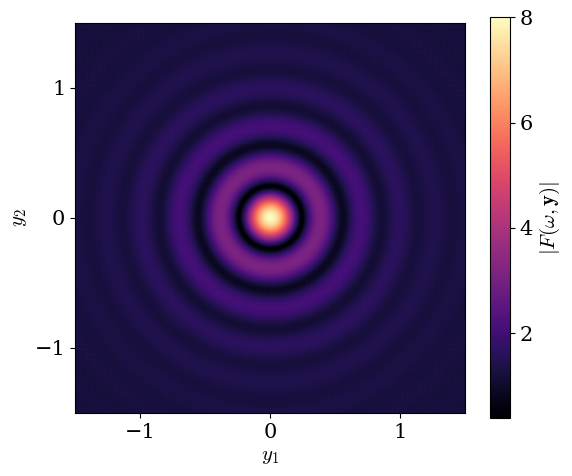

In [35]:
animate_Fw(
    lens=SIS(psi0=1.0),
    w_min=0.1,
    w_max=10.0,
    n_frames=50,
    gl_nodes_per_dim=5000,
    max_physical_radius=500.0,     # replaces your old "Umax" knob
    nufft_tol=1e-13,
    batch_frequencies=True,
    chunk_frequencies=True,       # single shared setup across all frames
    auto_R_from_gl_nodes=True,    # fixed physical window radius like your old usage
    use_tail_correction=True,
    numexpr_nthreads=64,
    verbose=False,
    y_extent=1.5,
    Ny=500,
    Nx=500,
    cmap="magma",
    font_size=15,
)